## Laboratory work 1: The human brain connectome

Dear students!

In our first laboratory activity, we would like to invite you to explore the human brain connectome that was obtained as part of our research project __[Human Connectome Project (HCP)](https://www.humanconnectome.org/)__ (in the following __[article](https://link.springer.com/article/10.1007/s11571-017-9445-1)__).

You have been provided with __[several files](https://drive.google.com/drive/folders/1aLmWQfYGP5jOa0cojA5zgpPP3sMeso_Li7r9KZaJ6GVSpMupYsIjeBmKa3oZ69LXiuSaWyul?usp=sharing)__ for the same connectome at different resolutions, in case you would like to manipulate the data on smaller graphs or use some more complex algorithms.

However, it is recommended to present the final results at the highest possible resolution of the connectome.

Total points for all problems: `100`

In [1]:
!pip install powerlaw
!pip install pybind11
!pip install graph-walker

In [2]:
from collections import defaultdict
from typing import Union
import os.path as osp
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import networkx as nx
import pandas as pd
import powerlaw
import numpy as np
from scipy.stats import kstest
import community.community_louvain as community
from tqdm import tqdm
import walker

### Utils

In [3]:
def brain_area_function(
    brain_area_name: str,
    map: dict[str, str] = None,
) -> str:
    """
    Retrieves the function of a brain area by mapping its name through a provided dictionary.
    If the brain area name is not found, returns the original name.

    Args:
        brain_area_name (str):
            The name of the brain area.
        map (dict[str, str], optional):
            A dictionary mapping brain area names to their respective functions.
            Defaults to an empty dictionary if not provided.

    Returns:
        str: The mapped function of the brain area if available, otherwise the original name.
    """
    if map is None:
        map = {
            "Cortical": "Higher cognitive functions, thinking",
            "Subcortical": "Movement regulation, emotions, memory",
            "Parstriangularis": "Speech processing, language comprehension",
            "Precentral": "Movement control (motor cortex)",
            "Superiorparietal": "Spatial perception, attention",
            "Lateraloccipital": "Visual information processing",
            "Entorhinal": "Memory formation, connection with the hippocampus",
            "Left-pallidum": "Movement, regulation of motor functions",
            "Right-pallidum": "Movement, regulation of motor functions",
            "Posteriorcingulate": "Memory, attention, orientation",
            "Caudalmiddlefrontal": "Planning, cognitive control",
            "Right-thalamus-proper": "Transmission of sensory signals to the cortex",
            "Left-thalamus-proper": "Transmission of sensory signals to the cortex",
            "Left-amygdala": "Emotions, fear, aggression",
            "Right-amygdala": "Emotions, fear, aggression",
            "Parsopercularis": "Speech production, sound processing",
            "Caudalanteriorcingulate": "Emotion control, decision-making",
            "Parsorbitalis": "Regulation of behavior, social interactions",
            "Medialorbitofrontal": "Training, evaluation of remuneration",
            "Right-accumbens-area": "Motivation, reward system",
            "Left-accumbens-area": "Motivation, reward system",
            "Lingual": "Visual information processing",
            "Right-caudate": "Movement control, training",
            "Left-caudate": "Movement control, training",
            "Postcentral": "Sensory information, sense of touch",
            "Temporalpole": "Memory, emotion processing",
            "Precuneus": "Consciousness, self-awareness, attention",
            "Middletemporal": "Processing of hearing and visual information",
            "Transversetemporal": "Sound and speech analysis",
            "Insula": "Body sensations, emotions, pain perception",
            "Paracentral": "Control of leg and trunk movements",
            "Left-putamen": "Movement, skill formation",
            "Right-putamen": "Movement, skill formation",
            "Lateralorbitofrontal": "Emotion control, decision-making",
            "Isthmuscingulate": "Emotions, memory, behavior regulation",
            "Fusiform": "Face and object recognition",
            "Rostralmiddlefrontal": "Planning, decision-making",
            "Supramarginal": "Speech comprehension, sensorimotor integration",
            "Right-hippocampus": "Formation of long-term memory",
            "Left-hippocampus": "Formation of long-term memory",
            "Cuneus": "Processing of visual stimuli",
            "Bankssts": "Speech analysis, sound perception",
            "Frontalpole": "Abstract thinking, planning",
            "Superiortemporal": "Speech and sound processing",
            "Inferiorparietal": "Integration of hearing, vision, and attention",
            "Pericalcarine": "Primary visual cortex, image processing",
            "Parahippocampal": "Memory, spatial orientation",
            "Brain-stem": "Vital functions (breathing, heart)",
            "Superiorfrontal": "Attention control, motor planning",
            "Rostralanteriorcingulate": "Emotions, behavior control",
            "Inferiortemporal": "Object recognition, visual image processing",
        }

    return map.get(brain_area_name, brain_area_name)


def canonize_key(
    key: str,
) -> str:
    """
    Converts a given key into a standardized format by:
    - Removing hemisphere indicators (`lh`, `rh`).
    - Replacing periods with underscores.
    - Stripping numerical suffixes.
    - Capitalizing the first letter.

    Args:
        key (str):
            The key to be standardized.

    Returns:
        str: A canonized version of the key.
        ```
    """
    splitted_key = list(filter(
        lambda s: s not in ['lh', 'rh'],
        key.lower().replace('.', '_').split('_')
    ))

    canonized_key = splitted_key[0] if splitted_key else key
    canonized_key = canonized_key.rstrip('0123456789').capitalize()

    return canonized_key


def get_neuron_info(
    neuron_data: dict[str, str],
    map: dict[str, str] = None,
) -> tuple[str, str, str, str]:
    """
    Extracts and standardizes neuron information, including its region, name, hemisphere,
    and function, using optional mapping.

    Args:
        neuron_data (dict[str, str]):
            A dictionary containing neuron attributes, including:
            - "dn_region": The region where the neuron is located.
            - "dn_name": The name of the neuron.
            - "dn_hemisphere": The hemisphere (left/right) where the neuron is located.
        map (dict[str, str], optional):
            A dictionary mapping neuron attributes to their standardized values.
            Defaults to an empty dictionary if not provided.

    Returns:
        tuple[str, str, str, str]: A tuple containing:
            - Standardized region name.
            - Standardized neuron name.
            - Standardized hemisphere.
            - Mapped function of the neuron.
        ```
    """

    region = canonize_key(neuron_data.get('dn_region', 'N/A'))
    name = canonize_key(neuron_data.get('dn_name', 'N/A'))
    hemisphere = canonize_key(neuron_data.get('dn_hemisphere', 'N/A'))
    function = brain_area_function(name, map=map)

    # return (
    #     translate_key(region, map=map),
    #     translate_key(name, map=map),
    #     translate_key(hemisphere, map=map),
    #     function,
    # )
    return (
        region,
        name,
        hemisphere,
        function,
    )


In [4]:
def get_node_colors(
    node_attrs: list,
) -> list:
    """
    Assigns RGB colors to unique node attributes and returns a list of corresponding colors.

    Args:
        node_attrs (list):
            A list of node attributes, where each attribute represents a category.
            Nodes with the same attribute will be assigned the same color.

    Returns:
        list:
            A list of RGB color strings (formatted as "rgb(R, G, B)") corresponding to each
            attribute in the input list.
    """

    # Obtain unique attributes
    unique_attrs = list(set(node_attrs))

    # Assign RGB colors to the attributes
    cmap = plt.get_cmap("turbo", len(unique_attrs))
    color_map = {
        attr: f"rgb({int(cmap(i)[0]*255)}, {int(cmap(i)[1]*255)}, {int(cmap(i)[2]*255)})"
        for i, attr in enumerate(unique_attrs)
    }

    # Assign corresponding colors to the nodes
    node_colors = [color_map[attr] for attr in node_attrs]

    return node_colors


In [5]:
def plot_connectome(
    G: nx.Graph,
    node_colors: Union[str, list[str]] = 'red',
    show_legend: bool = True,
):
    """
    Plots a 3D connectome graph based on node positions and connectivity.

    Args:
        G:
            A NetworkX graph containing nodes with attributes 'dn_position_x',
            'dn_position_y', and 'dn_position_z'.
        node_colors (str or list, optional):
            The color(s) assigned to nodes. Can be a single color or a list matching
            the number of nodes.
        show_legend (bool, optional):
            Whether to display a legend grouping nodes by color. Defaults to True.

    Returns:
        None: Displays an interactive 3D plot of the connectome.
    """

    # Extract node positions
    positions = {node: (
        float(data['dn_position_x']),
        float(data['dn_position_y']),
        float(data['dn_position_z'])
        )
        for node, data in G.nodes(data=True)
    }

    # Edges coordinates
    edge_x = []
    edge_y = []
    edge_z = []

    for edge in G.edges():
        x0, y0, z0 = positions[edge[0]]
        x1, y1, z1 = positions[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_z.extend([z0, z1, None])

    # Nodes coordinates
    node_x = [pos[0] for pos in positions.values()]
    node_y = [pos[1] for pos in positions.values()]
    node_z = [pos[2] for pos in positions.values()]

    # Additional node info
    node_info = [
        "Region: {0}<br>Name: {1}<br>Hemisphere: {2}<br>Function: {3}".format(*get_neuron_info(data))
        for node, data in G.nodes(data=True)
    ]

    # Create 3D plot
    fig = go.Figure(layout={'width': 1200, 'height': 800})

    # Plot edges
    fig.add_trace(go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        mode='lines',
        line=dict(color='rgba(0, 0, 255, 0.1)', width=1),
        name='edges',
        hoverinfo='skip',
        showlegend=False,
    ))

    # Plot nodes
    fig.add_trace(go.Scatter3d(
        x=node_x, y=node_y, z=node_z,
        mode='markers',
        marker=dict(size=5, color=node_colors),
        text=node_info,
        hoverinfo='text',
        name='nodes',
        showlegend=False,
    ))

    # Configure plot appearance
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title="Brain Connectome"
    )

    # Group nodes by color for legend
    color_groups = defaultdict(list)
    for node, color in zip(G.nodes(), node_colors):
        region, name, hemisphere, function = get_neuron_info(G.nodes[node])
        color_groups[color].append(name)

    if show_legend:
        for color, nodes in color_groups.items():
            fig.add_trace(go.Scatter3d(
                x=[None], y=[None], z=[None],
                mode='markers',
                marker=dict(size=5, color=color),
                name=f"{'<br>'.join(set(nodes))}",
                hoverinfo='skip',
                legendwidth=3,
            ))

        fig.update_layout(
            legend=dict(
                x=1.05,
                y=1,
                xanchor="left",
                yanchor="top",
                bgcolor="rgba(255, 255, 255, 0.7)",
                font=dict(size=10),
                itemwidth=30,
                bordercolor="black",
                borderwidth=1,
                tracegroupgap=5,
            )
        )

    fig.show()


## 0. How to plot connectome

In [6]:
graph_path = osp.join(".", "brain_scale500.graphml")
G = nx.read_graphml(graph_path)

In [7]:
# Extract unique regions and assign colors
color_by='dn_name'
node_names = [
    canonize_key(data.get(color_by, 'Unknown'))
    for node, data in G.nodes(data=True)
]
node_colors = get_node_colors(node_names)

# Plot the connectome
plot_connectome(G, node_colors=node_colors)

## Problem 1. Graph analysis (25 points)

### 1.1. The main characteristics of the graph, clustering coefficient

- Select the largest connected component from the graph. Here and further in the laboratory we will work with it.

- Calculate the main characteristics of the graph (clustering coefficient, diameter, radius, average length of the shortest path)

- Construct a histogram of the distribution of clustering coefficients of individual vertices

- Plot the dependence of the clustering coefficient on the degree of the vertex

Retrieving the largest connected component from the graph:

In [8]:
sub_G = G.subgraph(max(nx.connected_components(G), key=lambda x: len(x)))

In [ ]:
len(G.nodes())

1015

In [ ]:
len(sub_G.nodes())

748

Calculating the main charasteristics of the chosen subgraph:

In [ ]:
#clustering coefficient
nx.average_clustering(sub_G)

0.6390347805374883

In [ ]:
#diameter
nx.diameter(sub_G)

9

In [ ]:
#radius
nx.radius(sub_G)

5

In [ ]:
#average length of the shortest path
nx.average_shortest_path_length(sub_G)

3.0968329646572026

Distribution of clustering coefficients of individual vertices:

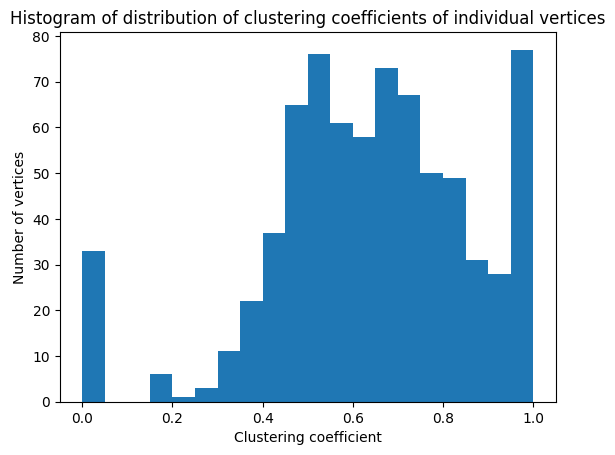

In [ ]:
fig, ax = plt.subplots()

ax.hist(nx.clustering(sub_G).values(), bins=20)

ax.set_ylabel('Number of vertices')
ax.set_xlabel('Clustering coefficient')
ax.set_title('Histogram of distribution of clustering coefficients of individual vertices')

plt.show()

Dependence of the clustering coefficient on the degree of the vertex:

In [95]:
clustering_coefficients = nx.clustering(sub_G).values()
degrees = dict(sub_G.degree()).values()

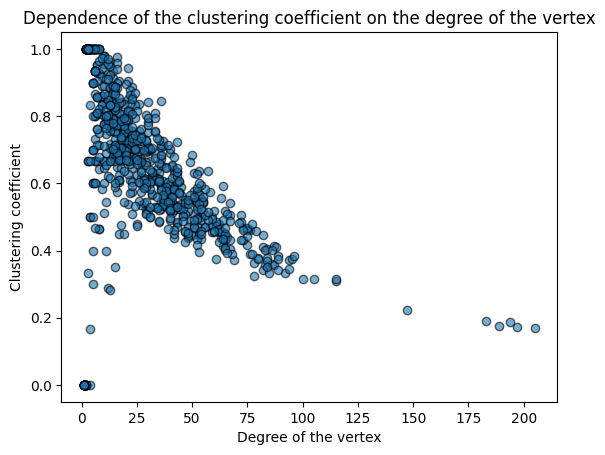

In [97]:
fig, ax = plt.subplots()

ax.scatter(x=degrees, y=clustering_coefficients, edgecolors='black', alpha=0.6)

ax.set_xlabel('Degree of the vertex')
ax.set_ylabel('Clustering coefficient')
ax.set_title('Dependence of the clustering coefficient on the degree of the vertex')

plt.show()

### 1.2. Path length

- Calculate the average length of the shortest path between two vertices of the graph

- Plot a histogram of the dependence of the average length of the shortest path on the degree of the vertex

In [ ]:
#average length of the shortest path
nx.average_shortest_path_length(sub_G)

3.0968329646572026

In [ ]:
paths = dict(nx.all_pairs_shortest_path_length(sub_G))

In [ ]:
avg_shortest_paths_lenghts = dict()
for vertex in paths.keys():
    avg_shortest_paths_lenghts[vertex] = sum(paths[vertex].values())/(len(sub_G.nodes())-1)

In [ ]:
avg_shortest_path_length_of_degree = pd.DataFrame(data=[degrees, avg_shortest_paths_lenghts.values()]).T.groupby(0).mean()

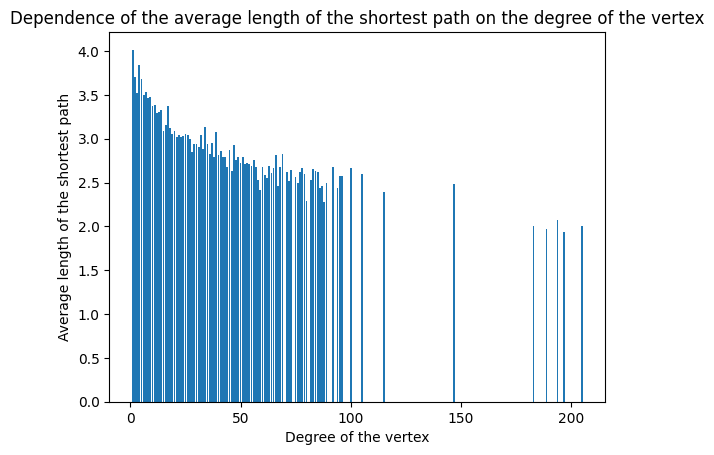

In [ ]:
fig, ax = plt.subplots()

ax.bar(x=avg_shortest_path_length_of_degree.index, height=avg_shortest_path_length_of_degree[1])

ax.set_xlabel('Degree of the vertex')
ax.set_ylabel('Average length of the shortest path')
ax.set_title('Dependence of the average length of the shortest path on the degree of the vertex')

plt.show()

### 1.3. Distribution of node degrees

- What is the distribution of node degrees? Run goodness-of-fit test and estimate parameters of the distribution.

Distribution of node degrees:

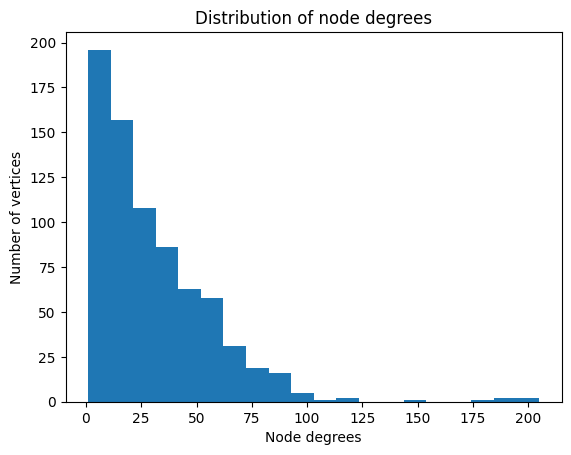

In [ ]:
fig, ax = plt.subplots()

ax.hist(degrees, bins=20)

ax.set_ylabel('Number of vertices')
ax.set_xlabel('Node degrees')
ax.set_title('Distribution of node degrees')

plt.show()

Seems that the distribution is like a power law distribution (or maybe exponential). Let's check it by obtaining optimal parameters of these two distributions for every possible xmin and calculating Kolmogorov-Smirnov statistics. We can do it with the help of python package named "powerlaw"

In [ ]:
sorted_degrees = np.sort(np.unique(list(degrees)))[:-1]
KS_statistics_powerlaw = []
KS_statistics_exponential = []
for degree in sorted_degrees:
    fit = powerlaw.Fit(list(degrees), xmin=degree)
    KS_statistics_powerlaw.append(kstest(list(degrees), fit.power_law.cdf).statistic)
    KS_statistics_exponential.append(kstest(list(degrees), fit.exponential.cdf).statistic)

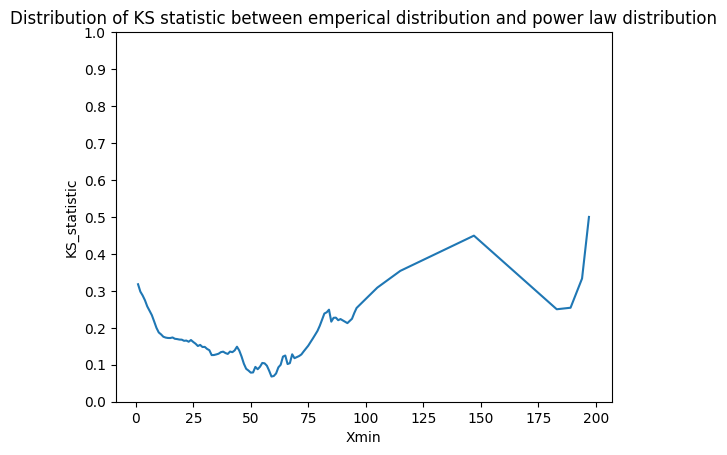

In [ ]:
fig, ax = plt.subplots()

ax.plot(sorted_degrees, KS_statistics_powerlaw)

ax.set_ylabel('KS_statistic')
ax.set_xlabel('Xmin')
ax.set_title('Distribution of KS statistic between emperical distribution and power law distribution')
ax.set_yticks(np.arange(0, 1.1, 0.1))

plt.show()

In [ ]:
#getting first local minimum
for i in range(len(KS_statistics_powerlaw)):
    if KS_statistics_powerlaw[i+1] > KS_statistics_powerlaw[i]:
        print(sorted_degrees[i])
        break

15


In [ ]:
fit_powerlaw = powerlaw.Fit(list(degrees), xmin=15)

In [ ]:
kstest(list(degrees), fit_powerlaw.power_law.cdf)

KstestResult(statistic=np.float64(0.17234157492288632), pvalue=np.float64(6.757681547316315e-20), statistic_location=np.int64(9), statistic_sign=np.int8(-1))

Seems that p-value is very close to 0, so we almost always must cancel H0 hypothesis that our data is sampled from power law distribution.

Let's check global minimum of KS statistic.

In [ ]:
fit_powerlaw_min = powerlaw.Fit(list(degrees), xmin=sorted_degrees[KS_statistics_powerlaw.index(min(KS_statistics_powerlaw))])

In [ ]:
kstest(list(degrees), fit_powerlaw_min.power_law.cdf)

KstestResult(statistic=np.float64(0.06815167095816166), pvalue=np.float64(0.0018255683815797633), statistic_location=np.int64(4), statistic_sign=np.int8(1))

P-value is too low for every possible xmin for this distribution.

Let's check exponential distribution:

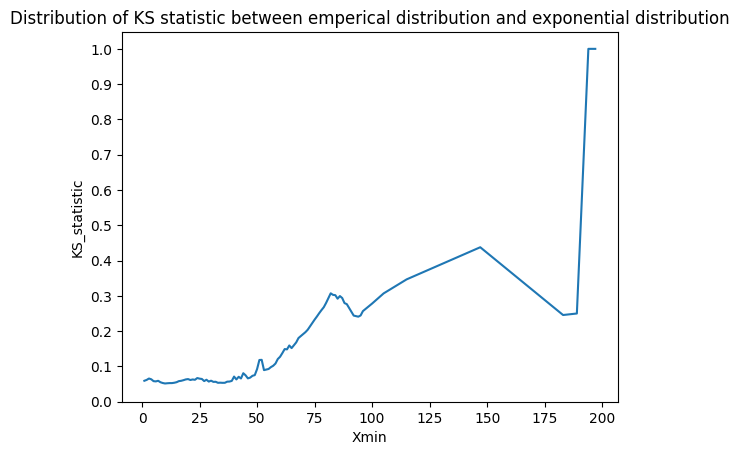

In [ ]:
fig, ax = plt.subplots()

ax.plot(sorted_degrees, KS_statistics_exponential)

ax.set_ylabel('KS_statistic')
ax.set_xlabel('Xmin')
ax.set_title('Distribution of KS statistic between emperical distribution and exponential distribution')
ax.set_yticks(np.arange(0, 1.1, 0.1))

plt.show()

In [ ]:
#getting first local minimum
for i in range(len(KS_statistics_exponential)):
    if KS_statistics_exponential[i+1] > KS_statistics_exponential[i]:
        print(sorted_degrees[i])
        break

1


In [ ]:
fit_exponential = powerlaw.Fit(list(degrees), xmin=1)

In [ ]:
kstest(list(degrees), fit_exponential.exponential.cdf)

KstestResult(statistic=np.float64(0.0593963027845153), pvalue=np.float64(0.0097857072976219), statistic_location=np.int64(14), statistic_sign=np.int8(-1))

Let's check global minimum of KS statistic.

In [ ]:
fit_exponential_min = powerlaw.Fit(list(degrees), xmin=sorted_degrees[KS_statistics_exponential.index(min(KS_statistics_exponential))])

In [ ]:
kstest(list(degrees), fit_exponential_min.exponential.cdf)

KstestResult(statistic=np.float64(0.051715529714206676), pvalue=np.float64(0.03530977862469464), statistic_location=np.int64(19), statistic_sign=np.int8(-1))

Seems that it is more likely that our data is sampled from exponential distribution than from power law distribution, but still we should cancel H0 hypothesises for both types of distributions.

Let's plot distributions that we got from local minimums of KS statistics.

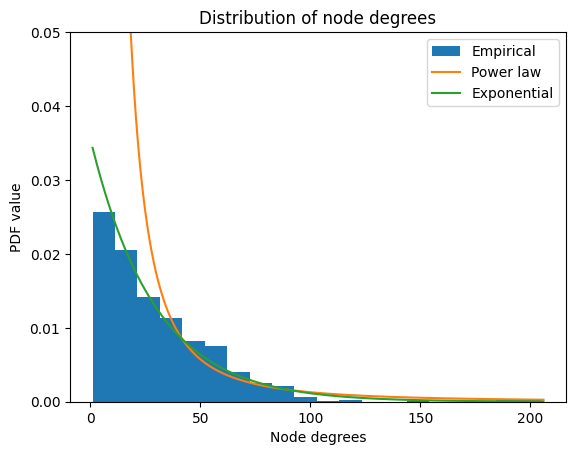

In [ ]:
fig, ax = plt.subplots()

ax.hist(degrees, bins=20, density=True, label='Empirical')
ax.plot(np.linspace(fit_powerlaw.power_law.xmin, max(degrees)+1, 1000), fit_powerlaw.power_law.pdf(np.linspace(fit_powerlaw.power_law.xmin, max(degrees)+1, 1000)), label='Power law')
ax.plot(np.linspace(fit_exponential.exponential.xmin, max(degrees)+1, 1000), fit_exponential.exponential.pdf(np.linspace(fit_exponential.exponential.xmin, max(degrees)+1, 1000)), label='Exponential')

ax.set_ylabel('PDF value')
ax.set_xlabel('Node degrees')
ax.set_title('Distribution of node degrees')
ax.set_ylim(0, 0.05)
ax.legend()

plt.show()

Speaking of parameters of potential distributions:

In [ ]:
print(f'Exponential: lambda={"{:.4f}".format(fit_exponential.exponential.Lambda)}, xmin={int(fit_exponential.xmin)}')
print(f'Power Law: alpha={"{:.4f}".format(fit_powerlaw.power_law.alpha)}, xmin={int(fit_powerlaw.xmin)}, C={"{:.4f}".format((fit_powerlaw.power_law.alpha-1)*(fit_powerlaw.xmin**(fit_powerlaw.power_law.alpha-1)))}')

Exponential: lambda=0.0344, xmin=1
Power Law: alpha=2.1582, xmin=15, C=26.6628


### 1.4. Determine which are the most important and significant neurons in our brain?

I think that for this task we should use centrality measures and sort neurons according to values of these metrics

In [ ]:
def get_top_neurons_by_centrality(centrality_measure, top_n):

    centrality_dict = centrality_measure(sub_G)
    top = sorted(centrality_dict, key=centrality_dict.get, reverse=True)
    top_values = map(centrality_dict.get, top)
    return(list(enumerate(zip(top, top_values)))[:top_n])

In [ ]:
#top-20 neurons by degree centrality
get_top_neurons_by_centrality(nx.degree_centrality, 20)

[(0, ('503', 0.27443105756358765)),
 (1, ('1008', 0.2637215528781794)),
 (2, ('504', 0.2597054886211513)),
 (3, ('502', 0.25301204819277107)),
 (4, ('1009', 0.24497991967871485)),
 (5, ('1010', 0.19678714859437751)),
 (6, ('505', 0.1539491298527443)),
 (7, ('770', 0.1539491298527443)),
 (8, ('487', 0.14056224899598393)),
 (9, ('127', 0.13386880856760375)),
 (10, ('826', 0.1285140562248996)),
 (11, ('771', 0.12717536813922356)),
 (12, ('285', 0.1258366800535475)),
 (13, ('632', 0.1258366800535475)),
 (14, ('494', 0.12315930388219544)),
 (15, ('769', 0.11914323962516733)),
 (16, ('816', 0.11914323962516733)),
 (17, ('1013', 0.11914323962516733)),
 (18, ('326', 0.11780455153949129)),
 (19, ('255', 0.11646586345381525))]

Seems that the most outstanding neurons by this measure are first top-10, because after tenth neuron decrease in centrality between places becomes very small. These neurons are: '503', '1008', '504', '502', '1009', '1010', '505', '770', '487', '127'

In [ ]:
#top-20 neurons by eigenvector centrality
get_top_neurons_by_centrality(nx.eigenvector_centrality, 20)

[(0, ('502', 0.16786807663662084)),
 (1, ('503', 0.16740725044129698)),
 (2, ('1008', 0.1665328368755248)),
 (3, ('504', 0.15834180189207844)),
 (4, ('1009', 0.14440977691784915)),
 (5, ('505', 0.11734140657642972)),
 (6, ('1010', 0.10762760774805746)),
 (7, ('770', 0.10396870942000966)),
 (8, ('487', 0.1035200553193632)),
 (9, ('285', 0.09944356840533007)),
 (10, ('326', 0.09485825460283916)),
 (11, ('291', 0.0932117570679584)),
 (12, ('826', 0.09170464636219715)),
 (13, ('771', 0.09061631856579654)),
 (14, ('703', 0.09047578044644701)),
 (15, ('235', 0.08990093255611328)),
 (16, ('255', 0.08887568890099912)),
 (17, ('328', 0.08688813413990318)),
 (18, ('256', 0.08661629561199444)),
 (19, ('992', 0.08305651148162056))]

Seems that the most outstanding neurons by this measure are first top-5, because after tenth neuron decrease in centrality between places becomes very small. These neurons are: '502', '503', '1008', '504', '1009'

In [ ]:
#top-20 neurons by closeness centrality
get_top_neurons_by_centrality(nx.closeness_centrality, 20)

[(0, ('1008', 0.5151724137931034)),
 (1, ('502', 0.5064406779661017)),
 (2, ('1009', 0.49933155080213903)),
 (3, ('503', 0.49899799599198397)),
 (4, ('504', 0.4816247582205029)),
 (5, ('770', 0.4497290788681517)),
 (6, ('699', 0.4441141498216409)),
 (7, ('285', 0.44358669833729214)),
 (8, ('202', 0.4430604982206406)),
 (9, ('291', 0.4420118343195266)),
 (10, ('703', 0.4404481132075472)),
 (11, ('326', 0.43941176470588234)),
 (12, ('1013', 0.43941176470588234)),
 (13, ('328', 0.43786635404454866)),
 (14, ('128', 0.437609841827768)),
 (15, ('256', 0.4353146853146853)),
 (16, ('315', 0.4335461404526988)),
 (17, ('751', 0.4335461404526988)),
 (18, ('507', 0.43279258400927)),
 (19, ('486', 0.4322916666666667))]

Seems that the most outstanding neurons by this measure are first top-5, because after tenth neuron decrease in centrality between places becomes very small. These neurons are: '1008', '502', '1009', '503', '504'

In [ ]:
#top-20 neurons by betweenness centrality
get_top_neurons_by_centrality(nx.betweenness_centrality, 20)

[(0, ('1008', 0.2421469370007891)),
 (1, ('502', 0.18009177720732064)),
 (2, ('1009', 0.14644286031118997)),
 (3, ('503', 0.14220005565925148)),
 (4, ('504', 0.07271998320811557)),
 (5, ('1013', 0.036743017943204996)),
 (6, ('1010', 0.02843814867315022)),
 (7, ('385', 0.025172871624961443)),
 (8, ('770', 0.024943151925953876)),
 (9, ('751', 0.024810079094623624)),
 (10, ('128', 0.02193470214852212)),
 (11, ('938', 0.01979043812590229)),
 (12, ('888', 0.01738025358385576)),
 (13, ('202', 0.016440201556763054)),
 (14, ('838', 0.016048200999770154)),
 (15, ('303', 0.01599973893229082)),
 (16, ('291', 0.01564793697639871)),
 (17, ('507', 0.015254933274644554)),
 (18, ('699', 0.014851107743357966)),
 (19, ('769', 0.014724362051996804))]

Seems that the most outstanding neurons by this measure are first top-5, because after tenth neuron decrease in centrality between places becomes very small. These neurons are: '1008', '502', '1009', '503', '504'

The most important and significant neurons in our brain are '502', '503', '504', '1008' and '1009', because they are taking top-5 places in terms of each centrality with a big margin.

In [15]:
#here are some attributes of these neurons
top_neuron_info = [
    f"{node}, " + "Region: {0}; Name: {1}; Hemisphere: {2}; Function: {3}".format(*get_neuron_info(data))
    for node, data in sub_G.subgraph(['1008', '502', '1009', '503', '504']).nodes(data=True)
]
print('\n'.join(top_neuron_info))

1009, Region: Subcortical; Name: Left-caudate; Hemisphere: Left; Function: Movement control, training
502, Region: Subcortical; Name: Right-thalamus-proper; Hemisphere: Right; Function: Transmission of sensory signals to the cortex
503, Region: Subcortical; Name: Right-caudate; Hemisphere: Right; Function: Movement control, training
504, Region: Subcortical; Name: Right-putamen; Hemisphere: Right; Function: Movement, skill formation
1008, Region: Subcortical; Name: Left-thalamus-proper; Hemisphere: Left; Function: Transmission of sensory signals to the cortex


### 1.5. Is the human brain a complex network? Why?

For human brain to be a complex network it must have the next properties:

1.   Deegrees of neurons must be sampled from power-law distribution:

As we saw in 1.3, we can't prove this. But maybe we have a very shifted sample (because there are billions of neurons in human brain and we have only ~750). So, let's state that degrees of our neurons are sampled from power-law distribution

2.   Graph of our brain must have small average shortest path lenght (small-world) $<l> $ ~ $ O(log|V|)$:

Let's delete nodes from graph one by one and check if ratio holds

In [ ]:
log_nodes = []
avg_path = []
for i in range(len(sub_G.nodes)//2):
    subgraph = sub_G.subgraph(list(sub_G.nodes().keys())[i:])
    try:
        avg_path.append(nx.average_shortest_path_length(subgraph))
        log_nodes.append(np.log(len(subgraph.nodes)))
    except:
        print('Graph is no longer connected')
        break

Graph is no longer connected


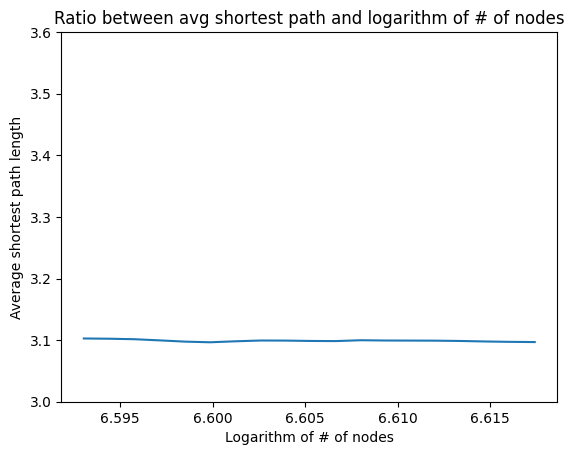

In [ ]:
fig, ax = plt.subplots()

ax.plot(log_nodes, avg_path)

ax.set_ylabel('Average shortest path length')
ax.set_xlabel('Logarithm of # of nodes')
ax.set_title('Ratio between avg shortest path and logarithm of # of nodes')
ax.set_yticks(np.arange(3, 3.6, 0.1))

plt.show()

As we can see, ratio holds, so, our graph has this property

3. A complex network consists of unconnected components, among which one is singled out, the number of vertices of which is of an order of magnitude close to the whole network:

As we can see, number of vertices of given brain is 1015 and number of vertices of its largest connected component is 748, so, our graph has this property.

4. Complex networks have large clustering coefficient:

In [ ]:
nx.average_clustering(sub_G)

0.6390347805374883

Clustering coefficient > 0.5, so, this property is held

5. Complex networks are sparse graphs:

$|E|$ ~ $O(|V|^a)$, $a \in (1,2)$

Let's delete nodes from graph one by one and check if ratio holds

In [ ]:
edges = []
nodes = []
for i in range(300):
    subgraph = sub_G.subgraph(list(sub_G.nodes().keys())[i:])
    edges.append(len(subgraph.edges))
    nodes.append(len(subgraph.nodes))

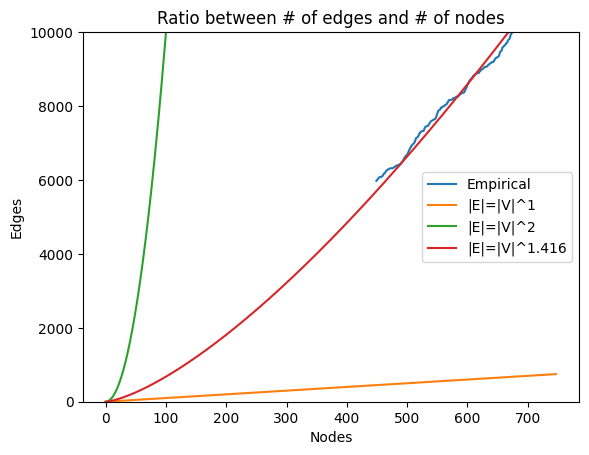

In [ ]:
fig, ax = plt.subplots()

ax.plot(nodes, edges, label='Empirical')
ax.plot(np.arange(len(sub_G.nodes)), np.arange(len(sub_G.nodes)), label='|E|=|V|^1')
ax.plot(np.arange(len(sub_G.nodes)), np.arange(len(sub_G.nodes))**2, label='|E|=|V|^2')

ax.plot(np.arange(len(sub_G.nodes)), np.arange(len(sub_G.nodes))**1.416, label='|E|=|V|^1.416')

ax.set_ybound(0, 10000)
ax.set_ylabel('Edges')
ax.set_xlabel('Nodes')
ax.set_title('Ratio between # of edges and # of nodes')
ax.legend()

plt.show()

Seems that ratio is held.

Based on the above, we can say that the human brain is a complex network

## Problem 2. Labeling of the brain connectome (30 points)

- Create an automatic labeling of the brain's connectome. Labeling refers to the division of connections into a number of groups, and the assignment of each vertex to one of these groups.

- Try several different labeling algorithms and describe how you chose the values for their parameters.

- Compare the results of the different algorithms to each other and to the original labeling.

Edge betweenness algorithm:

Let's calculate it with different number of sets and choose the best one by modularity (i only tried 3 different values because partitioning takes very long time)

In [9]:
edge_betweenness_modularities = []
for i in (3, 5, 7):
    partition = nx.community.edge_betweenness_partition(sub_G, i)
    edge_betweenness_modularities.append(nx.algorithms.community.modularity(sub_G, partition))

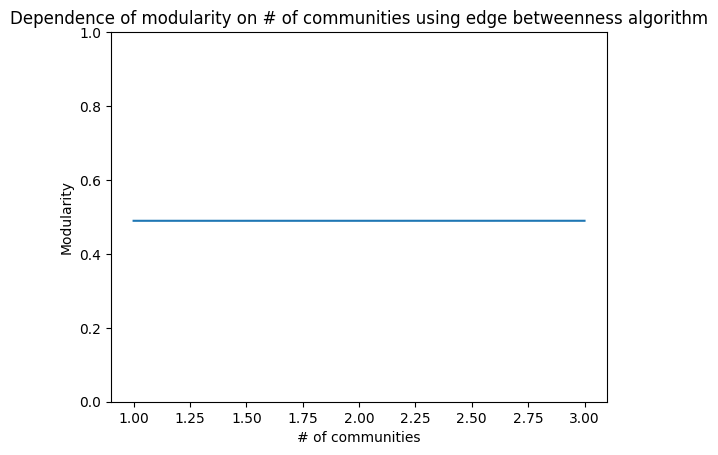

In [57]:
fig, ax = plt.subplots()

ax.plot(np.arange(1, len(edge_betweenness_modularities)+1), edge_betweenness_modularities)

ax.set_ylabel('Modularity')
ax.set_xlabel('# of communities')
ax.set_title('Dependence of modularity on # of communities using edge betweenness algorithm')
ax.set_ybound(0, 1)

plt.show()

In [59]:
max(edge_betweenness_modularities)

0.4895806975848561

Louvain method:

In [77]:
louvain_modularities = []
for i in np.logspace(-4, 1, 11):
    partition = nx.community.louvain_communities(sub_G, seed=0, resolution=i)
    louvain_modularities.append(nx.algorithms.community.modularity(sub_G, partition))

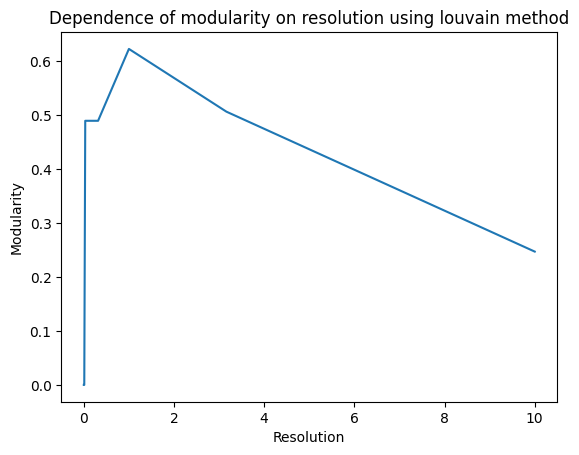

In [78]:
fig, ax = plt.subplots()

ax.plot(np.logspace(-4, 1, 11), louvain_modularities)

ax.set_ylabel('Modularity')
ax.set_xlabel('Resolution')
ax.set_title('Dependence of modularity on resolution using louvain method')

plt.show()

In [80]:
max(louvain_modularities)

0.6226409207511125

Label propogation:

In [13]:
partition = nx.community.label_propagation_communities(sub_G)
label_propogation_modularity = nx.algorithms.community.modularity(sub_G, partition)
print(f'Modularity={label_propogation_modularity}')

Modularity=0.5850207019359284


Asynchronous label propogation:

In [26]:
partition = nx.community.asyn_lpa_communities(sub_G, seed=0)
async_label_propogation_modularity = nx.algorithms.community.modularity(sub_G, partition)
print(f'Modularity={async_label_propogation_modularity}')

Modularity=0.6186940867282983


Ego-splitting algorithm:

Taken from here https://github.com/benedekrozemberczki/EgoSplitting/tree/master

In [23]:
# @title Ego-Splitter class

class EgoNetSplitter(object):

    def __init__(self, resolution=1.0):
        self.resolution = resolution

    def _create_egonet(self, node):
        """
        Creating an ego net, extracting personas and partitioning it.

        Args:
            node: Node ID for egonet (ego node).
        """
        ego_net_minus_ego = self.graph.subgraph(self.graph.neighbors(node))
        components = {i: n for i, n in enumerate(nx.connected_components(ego_net_minus_ego))}
        new_mapping = {}
        personalities = []
        for k, v in components.items():
            personalities.append(self.index)
            for other_node in v:
                new_mapping[other_node] = self.index
            self.index = self.index+1
        self.components[node] = new_mapping
        self.personalities[node] = personalities

    def _create_egonets(self):
        """
        Creating an egonet for each node.
        """
        self.components = {}
        self.personalities = {}
        self.index = 0
        print("Creating egonets.")
        for node in tqdm(self.graph.nodes()):
            self._create_egonet(node)

    def _map_personalities(self):
        """
        Mapping the personas to new nodes.
        """
        self.personality_map = {p: n for n in self.graph.nodes() for p in self.personalities[n]}

    def _get_new_edge_ids(self, edge):
        """
        Getting the new edge identifiers.
        Args:
            edge: Edge being mapped to the new identifiers.
        """
        return (self.components[edge[0]][edge[1]], self.components[edge[1]][edge[0]])

    def _create_persona_graph(self):
        """
        Create a persona graph using the egonet components.
        """
        print("Creating the persona graph.")
        self.persona_graph_edges = [self._get_new_edge_ids(e) for e in tqdm(self.graph.edges())]
        self.persona_graph = nx.from_edgelist(self.persona_graph_edges)

    def _create_partitions(self):
        """
        Creating a non-overlapping clustering of nodes in the persona graph.
        """
        print("Clustering the persona graph.")
        self.partitions = community.best_partition(self.persona_graph, resolution=self.resolution)
        self.overlapping_partitions = {node: [] for node in self.graph.nodes()}
        for node, membership in self.partitions.items():
            self.overlapping_partitions[self.personality_map[node]].append(membership)

    def fit(self, graph):
        """
        Fitting an Ego-Splitter clustering model.

        Arg types:
            * **graph** *(NetworkX graph)* - The graph to be clustered.
        """
        self.graph = graph
        self._create_egonets()
        self._map_personalities()
        self._create_persona_graph()
        self._create_partitions()

    def get_memberships(self):
        r"""Getting the cluster membership of nodes.
        Return types:
            * **memberships** *(dictionary of lists)* - Cluster memberships.
        """
        return self.overlapping_partitions

In [75]:
ego_splitting_modularities = []
for i in np.logspace(-4, 1, 11):
    splitter = EgoNetSplitter(resolution=i)
    splitter.fit(sub_G)
    splits = set()
    partition = []
    for groups in splitter.get_memberships().values():
        for group in groups:
            splits.add(group)
    visited_nodes = set()
    for split in splits:
        group = set()
        for node in splitter.get_memberships():
            if split in splitter.get_memberships()[node] and node not in visited_nodes:
                group.add(node)
                visited_nodes.add(node)
        partition.append(group)
    ego_splitting_modularities.append(nx.algorithms.community.modularity(sub_G, partition))

Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 1743.26it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 195921.04it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 1583.39it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 175480.79it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2781.70it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 313151.78it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 1326.52it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 117010.09it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 1910.71it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 302950.20it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2953.85it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 324373.72it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2769.99it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 314515.54it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2976.70it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 297530.39it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2813.58it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 317189.52it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 2698.73it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 301247.91it/s]


Clustering the persona graph.
Creating egonets.


100%|██████████| 748/748 [00:00<00:00, 1263.84it/s]


Creating the persona graph.


100%|██████████| 11261/11261 [00:00<00:00, 166427.26it/s]


Clustering the persona graph.


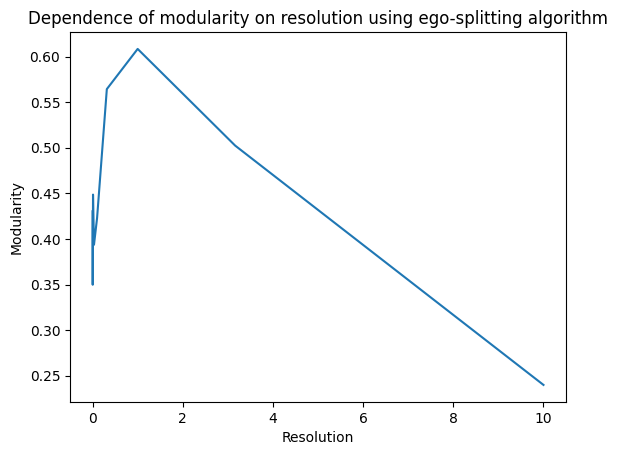

In [76]:
fig, ax = plt.subplots()

ax.plot(np.logspace(-4, 1, 11), ego_splitting_modularities)

ax.set_ylabel('Modularity')
ax.set_xlabel('Resolution')
ax.set_title('Dependence of modularity on resolution using ego-splitting algorithm')

plt.show()

In [79]:
max(ego_splitting_modularities)

0.6084122378528452

Seems that the best labeling algorithm for this graph is Louvain method with the next resolution parameter, that was found by gridsearch

In [83]:
print(f'Resolution={np.logspace(-4, 1, 11)[louvain_modularities.index(max(louvain_modularities))]}')

Resolution=1.0


In [92]:
best_labeling = nx.community.louvain_communities(sub_G, seed=0, resolution=1)
nx.algorithms.community.modularity(sub_G, best_labeling)

0.6226409207511125

Let's compare the results with original labeling:

In [91]:
areas_set = set()
original_labeling = []
for node, neuron_data in sub_G.nodes(data=True):
    areas_set.add(canonize_key(neuron_data.get('dn_name', 'N/A')))
for area in areas_set:
    area_nodes = set()
    for node, neuron_data in sub_G.nodes(data=True):
        if canonize_key(neuron_data.get('dn_name', 'N/A')) == area:
            area_nodes.add(node)
    original_labeling.append(area_nodes)
print(f'Modularity of original labeling = {nx.algorithms.community.modularity(sub_G, original_labeling)}')

Modularity of original labeling = 0.1761307522133821


As we can see, every approach of automatic labeling gives better results than original one

## Problem 3. Assortativity (15 points)

- Рассмотрите:
  - Коннектом целиком
  - Различные области, найденные с помощью автоматической разметки, по отдельности
- Посчитайте для них ассортативность, постройте необходимые графики
- Проанализируйте результаты
- Consider:
  - Connect as a whole
  - Various areas found using automatic labeing individually
- Calculate the assortativity for them, plot the necessary graphs
- Analyze the results

I will analyze only chosen subgraph (not whole connectome), because this lab is focused on it.

In [93]:
nx.degree_assortativity_coefficient(sub_G)

-0.023608654977695178

As we can see, the assortativity coefficient is close to 0, indicating that the degrees of the nodes have no effect on their connection probability. Also, since the coefficient is less than 0, we can say that the network is rather disassortative than assortative

In [98]:
assortativity_of_labels = []
label_node_amount = []

for partition in best_labeling:
    subgraph = sub_G.subgraph(partition)
    assortativity_of_labels.append(nx.degree_assortativity_coefficient(subgraph))
    label_node_amount.append(len(partition))

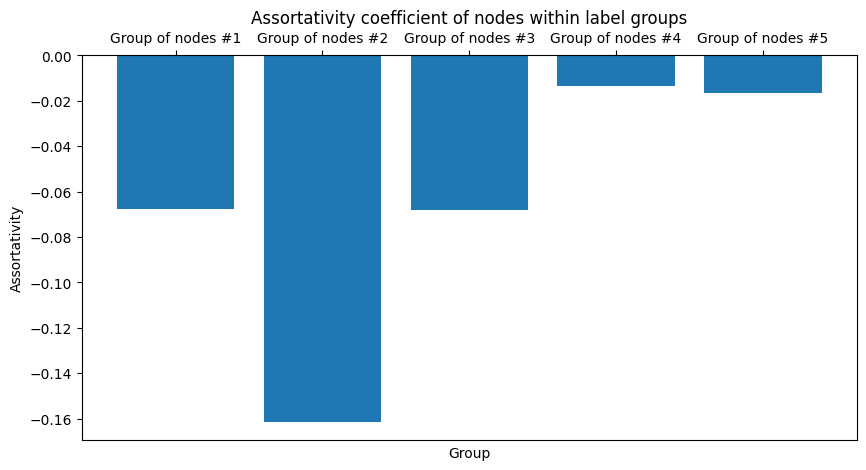

In [130]:
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)

ax.bar(x=list(map(lambda x: f'Group of nodes #{x}', range(1, len(best_labeling)+1))), height=assortativity_of_labels)

ax.set_ylabel('Assortativity')
ax.set_xlabel('Group')
ax.tick_params(axis='x', top=True, labeltop=True, bottom=False, labelbottom=False)
ax.set_title('Assortativity coefficient of nodes within label groups')

plt.show()

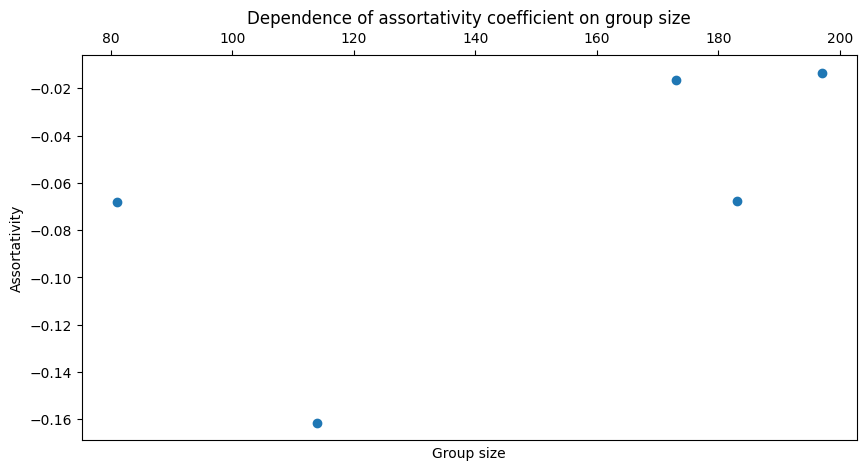

In [133]:
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)

ax.scatter(label_node_amount, assortativity_of_labels)

ax.set_ylabel('Assortativity')
ax.set_xlabel('Group size')
ax.tick_params(axis='x', top=True, labeltop=True, bottom=False, labelbottom=False)
ax.set_title('Dependence of assortativity coefficient on group size')

plt.show()

As we can see, all of the groups of nodes that was obtained by labeling algorithm have assortativity coefficient that is less than zero but very close to it. Also we can say that one of the groups has bigger tendency to be disassortative than others

## Problem 4. Transcranial magnetic stimulation (30 points)

__[Transcranial magnetic stimulation (TMS)](https://en.wikipedia.org/wiki/Transcranial_magnetic_stimulation)__ - a method that allows noninvasively stimulating the cerebral cortex. It is used for the rehabilitation of patients (for example, with motor disorders), and for the treatment of various diseases: Parkinson's disease, epilepsy, depression, schizophrenia, and others.

We would like to suggest that you conduct a TMS on your "patient". For this, you will need:

- "Weigh" the edges of the graph. For example, using some metric that decreases with increasing distance between vertices.

- Apply TMS to different areas of the brain. See how far the signal will spread, which areas it will affect, and what functions these areas are responsible for.

  Various methods can be used to implement signal propagation: `message passing', `random walk', `heat diffusion' and others.

  Try different methods (two or more), compare the results.

---

To determine which areas of the brain should be targeted with TMS, you can refer to scientific articles. For example:

__[Evidence-based guidelines on the therapeutic use of repetitive transcranial magnetic stimulation (rTMS)](https://www.sciencedirect.com/science/article/pii/S1388245719312799?via%3Dihub)__.

This article contains many studies that stimulated various areas of the brain using TMS. It also describes the symptoms of patients and the results of TMS use.

---

For example, in the picture below you can see:

- The patient's symptom is a motor disorder of the hand as a result of stroke.

- The area of application of TMS is the M1 zone. You can use a __[map of brain regions](https://atlas.brain-map.org/atlas?atlas=265297126)__ to orient yourself in the areas of a brain.

- The result of the therapy is an improvement in the patient's motor functions.

![lab_1_example.png](attachment:lab_1_example.png)

---

Good luck!

Weighing the edges:

I've decided to use the next metric: 1/(euclidian distance between nodes). This metric obviously decreases with increasing distance between vertices

In [9]:
for edge in sub_G.edges:
    sub_G.edges[edge[0], edge[1]]['weight'] = 1/((((sub_G.nodes[edge[0]]['dn_position_x']-sub_G.nodes[edge[1]]['dn_position_x'])**2) + ((sub_G.nodes[edge[0]]['dn_position_y']-sub_G.nodes[edge[1]]['dn_position_y'])**2) + ((sub_G.nodes[edge[0]]['dn_position_z']-sub_G.nodes[edge[1]]['dn_position_z'])**2))**0.5)

Implementing signal propogation with random walk:

Let's try to start random walks from significant neurons that were obtained in 1.4. we will start 100 times from each node, each walk will have 500 steps

In [10]:
walks = walker.random_walks(sub_G, n_walks=100, walk_len=500, start_nodes=['1008', '502', '1009', '503', '504'])

Random walks - T=0.52s


In [11]:
walks_from_nodes = []
for walk in walks:
    walks_from_nodes.append((walk[0], len(set(walk.ravel()))))
walk_df = pd.DataFrame(walks_from_nodes)

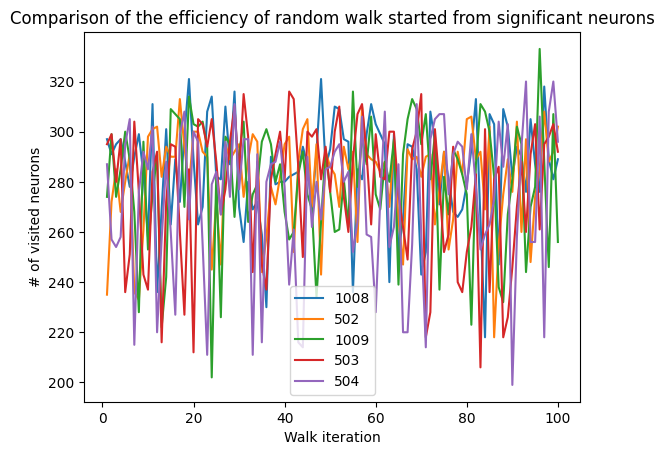

In [12]:
fig, ax = plt.subplots()

ax.plot(range(1, 101), walk_df[walk_df[0] == 1008][1], label='1008')
ax.plot(range(1, 101), walk_df[walk_df[0] == 502][1], label='502')
ax.plot(range(1, 101), walk_df[walk_df[0] == 1009][1], label='1009')
ax.plot(range(1, 101), walk_df[walk_df[0] == 503][1], label='503')
ax.plot(range(1, 101), walk_df[walk_df[0] == 504][1], label='504')

ax.set_ylabel('# of visited neurons')
ax.set_xlabel('Walk iteration')
ax.set_title('Сomparison of the efficiency of random walk started from significant neurons')
ax.legend()

plt.show()

In [13]:
walk_df.groupby(0)[1].mean().sort_values()

,1
0,
504,273.18
503,277.05
1009,279.88
502,281.39
1008,284.33


Seems that these 5 neurons have not so much difference in performance. Let's recall what are their functions

In [16]:
print('\n'.join(top_neuron_info))

1009, Region: Subcortical; Name: Left-caudate; Hemisphere: Left; Function: Movement control, training
502, Region: Subcortical; Name: Right-thalamus-proper; Hemisphere: Right; Function: Transmission of sensory signals to the cortex
503, Region: Subcortical; Name: Right-caudate; Hemisphere: Right; Function: Movement control, training
504, Region: Subcortical; Name: Right-putamen; Hemisphere: Right; Function: Movement, skill formation
1008, Region: Subcortical; Name: Left-thalamus-proper; Hemisphere: Left; Function: Transmission of sensory signals to the cortex


3 of these neurons are located in M1 area that is mentioned in the article.

Let's sort all the neurons in the brain by amount of visited neurons if we start random walk with them. By that we will get neurons that are most efficient to start from.

In [17]:
walks = walker.random_walks(sub_G, n_walks=2000, walk_len=500)

Random walks - T=68.62s


In [18]:
walks_from_nodes = []
for walk in walks:
    walks_from_nodes.append((walk[0], len(set(walk.ravel()))))
walk_df = pd.DataFrame(walks_from_nodes)

In [19]:
walk_df.groupby(0)[1].mean().sort_values()

,1
0,
558,275.4905
571,275.6200
518,275.7360
317,275.7780
687,275.7860
...,...
178,279.4285
536,279.4895
446,279.5565


Seems that if we use this method for TMS, almost nothing changes of choosing strating neuron in terms of visited neurons amount. Let's plot what neurons are getting visited more frequently than others (lighter the color -> more frequently this neuron gets visited)

In [25]:
random_walk_node_colors = []
for node in sub_G.nodes:
    times_node_was_met = (int(node) == walks).any(axis=1)
    rgb = f"rgb({int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)}, {int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)}, {int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)})"
    random_walk_node_colors.append(rgb)

In [26]:
plot_connectome(sub_G, node_colors=random_walk_node_colors)

As we can see, the least frequently visited neurons are those of occipital lobe of the left hemisphere of the brain. Particular functions of these neurons can be checked on illustration above.

Let's plot the same connectome random walks that start from significant neurons.

In [27]:
walks = walker.random_walks(sub_G, n_walks=2000, walk_len=500, start_nodes=['1008', '502', '1009', '503', '504'])

Random walks - T=0.49s


In [28]:
significant_random_walk_node_colors = []
for node in sub_G.nodes:
    times_node_was_met = (int(node) == walks).any(axis=1)
    rgb = f"rgb({int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)}, {int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)}, {int((sum(times_node_was_met)/times_node_was_met.shape[0])*255)})"
    significant_random_walk_node_colors.append(rgb)

In [29]:
plot_connectome(sub_G, node_colors=significant_random_walk_node_colors)

As we can see, pictures are quite similar. So, for this method it is not important where to start from.

Implementing signal propogation with message passing:

In [49]:
def message_passing(G, starting_nodes, steps_amount):

    signals = {node: 1.0 if node in starting_nodes else 0.0 for node in G.nodes}

    for _ in range(steps_amount):
        messages = {node: [] for node in G.nodes}

        for node_1, node_2, data in G.edges(data=True):
            weight = data.get('weight')
            messages[node_1].append(signals[node_2] * weight * 9.5)
            messages[node_2].append(signals[node_1] * weight * 9.5)

        for node in G.nodes:
            if messages[node]:
                avg_msg = sum(messages[node]) / len(messages[node])
                signals[node] = 0.7 * signals[node] + 0.3 * avg_msg

    return signals

In [79]:
def plot_message_passing(starting_nodes):
    message = message_passing(sub_G, starting_nodes, 500)
    message_passing_node_colors = []
    max_signal = max(message.values())
    for node in message:
        sickness = min((500**(int((message[node]/max(message.values()))*255) == 0))*(message[node]/max(message.values()))*255, 255)
        rgb = f"rgb({int(sickness)}, {int(sickness)}, {int(sickness)})"
        message_passing_node_colors.append(rgb)
    plot_connectome(sub_G, message_passing_node_colors)

In [81]:
for node in ('1008', '502', '1009', '503', '504'):
    print(f'Starting node: {node}')
    plot_message_passing([node])

Starting node: 1008


Starting node: 502


Starting node: 1009


Starting node: 503


Starting node: 504


Seems that this method gives different results (as we can see on the plot).
We can definetely say that stimulating neurons '503', '504', '1008' is better choice than stimulating '502' or '1009'. These neurons are placed in the areas that is mentioned in the article.